# Demo of two perpenticular projections in a Carm device

In [1]:
import ddrr
from ddrr.coordinates import Coordinate, CarmCoordinate, to_homo
from ddrr.projection import generate_grids_multi, calc_relative_atten_coef_cuda
import torch
import torch.nn.functional as F
import numpy as np

### Geometry Parameter

In [2]:
SID = 915 # in mm
SOD = 700
receptor_size = [155, 155]
projection_resolution = [512, 512]
sample_rate = 100
near_plane = 500
R_x = 0
R_y = 90
R_z = 0

### Compute DRR

In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Load CT into tensor with shape Bx1xHxWxD. B means number of subjects.
# ct should contain 
ct = calc_relative_atten_coef_cuda(torch.rand((1,1,20,20,20), device=device)*2000-1000) # torch.tensor(np.load(""))
ct_spacing = np.array([[5., 5., 5.]]) # Bx3

# Receptor coordinate to Carm coordinate. The iso center of current carm pose is the origin of the carm coordinate.
# 1 x 4 x 4
proj_to_carm = torch.tensor([[1.,0.,0.,0.], [0., 1., 0., 0.], [0., 0., -1., SID-SOD], [0.,0.,0.,1]])

# Carm to global coordinate. The isocenter of the Carm device at original pose is used as the origin of the global coordinate.
# arm_num x 4 x 4 
carm_to_global = CarmCoordinate([0.,0.,0.], [0., 0., 0.], arms=[[[0., 0., 0.,], [0., 0., 0.]], [[0., 0., 0.,], [R_x, R_y, R_z]]]).transform
# 1 x 4 x 4 
global_to_ct = Coordinate().transform # 1x4x4

# ct to pytorch image space [-1, 1]
(B, _, H, W, D) = ct.shape 
scale = 2. / (ct_spacing * np.array(((H-1),(W-1),(D-1))))
scale = np.repeat(
    np.expand_dims(
        np.concatenate((scale, np.ones((B,1))), axis=1), 1
        ), repeats=4, axis=1
    ) * np.eye(4, dtype=float)
ct_to_image = torch.tensor(scale, dtype=global_to_ct.dtype)

# Compose transformations. B x arm_num x 4 x 4
transform = (ct_to_image.unsqueeze(1)@(global_to_ct@carm_to_global@proj_to_carm).unsqueeze(0)).to(device)
(B, arm_num, _, _) = transform.shape

# The unit measure of the input is in mm. The returned grids is in receptor coordinate. 
# grids: 1 x resolution_0 x resolution_1 x sample_rate x 3
# dx: 1 x res_0 x res_1
grids, dx = generate_grids_multi(
    emi_pos=np.array([[0,0,SID]]), 
    proj_size=receptor_size, 
    resolution=projection_resolution, 
    sample_rate=sample_rate, 
    near_plane=near_plane, 
    device=device, dtype=torch.float32
    )
(_, res_0, res_1, sample_rate, _) = grids.shape
grids_in_ct = torch.matmul(transform.unsqueeze(2), to_homo(grids.reshape(-1, 3)).unsqueeze(-1)).squeeze(-1)[:,:,:,:3].reshape(B, arm_num, res_0, res_1, sample_rate, 3)

grids_in_ct = torch.flip(grids_in_ct, [5])
grids_in_ct = torch.reshape(grids_in_ct, (B,1,1,-1,3))
proj = torch.mul(
    torch.sum(
        F.grid_sample(
            ct, grids_in_ct, align_corners = True, padding_mode='zeros'
            ).reshape((B, arm_num, res_0, res_1, sample_rate)), dim=4
        ), dx
    ).float() # B x arm_num x res_0 x res_1

# Since dx is in mm unit while linear attenuation coefficients are in cm unit.
# Multiply the final result to reflect the unit transform.
proj *= 0.1

proj = proj.detach().cpu().numpy()

/home/lintian/anaconda3/envs/pyReg/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


### Plot projections

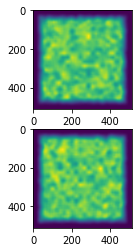

In [4]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2)
axes[0].imshow(proj[0,0])
axes[1].imshow(proj[0,1])

plt.show()

### Debug transformation matrix

In [8]:
transform = (ct_to_image.unsqueeze(1)@(global_to_ct@carm_to_global@proj_to_carm).unsqueeze(0)).to(device)
(B, arm_num, _, _) = transform.shape
grids_in_proj = torch.matmul(transform.unsqueeze(2), to_homo(grids.reshape(-1, 3)).unsqueeze(-1)).squeeze(-1)[:,:,:,:3].reshape(B, arm_num, res_0, res_1, sample_rate, 3)

In [16]:
import plotly.graph_objects as go

# grids_ = grids.detach()[0, ::10, ::10, ::2].cpu().reshape(-1,3).numpy()
grids_ = grids_in_proj.detach()[0, 0, ::10, ::10, ::2].cpu().reshape(-1,3).numpy()
fig = go.Figure(data=[go.Scatter3d(x=grids_[:,0], y=grids_[:,1], z=grids_[:,2],
                                   mode='markers')])
fig.show()

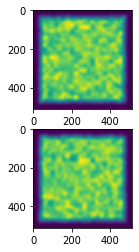